In [ ]:
coords=[["FEIJO",-8.04167,-70.2917],["Brasileija",-10.9583,-68.7083],["Labrea",-7.2083,-64.7917],
        ["Beruri",-3.875,-61.375],["manacapuru",-3.375,-60.625],["curicuriari",0.2083,-66.7917],
        ["Uaicas",3.54,-63.125],["paraiso",3.29,-60.62],["bandeirabranca",4.62,-60.37],["mucajai",2.4583,-60.875],
        ["pimenteiras",-13.54,-61.04],["flordocampo",-11.79,-60.875],["sitiobelavista",-11.625,-61.29],
        ["humaita",-7.54,-62.95],["pousadamatrinxa",-13.54,-53.12],["pedrado",-4.54,-53.95]]

import math

def dd2dms(longitude, latitude):

    # math.modf() splits whole number and decimal into tuple
    # eg 53.3478 becomes (0.3478, 53)
    split_degx = math.modf(longitude)
    
    # the whole number [index 1] is the degrees
    degrees_x = int(split_degx[1])

    # multiply the decimal part by 60: 0.3478 * 60 = 20.868
    # split the whole number part of the total as the minutes: 20
    # abs() absoulte value - no negative
    minutes_x = abs(int(math.modf(split_degx[0] * 60)[1]))

    # multiply the decimal part of the split above by 60 to get the seconds
    # 0.868 x 60 = 52.08, round excess decimal places to 2 places
    # abs() absoulte value - no negative
    seconds_x = abs(round(math.modf(split_degx[0] * 60)[0] * 60,2))

    # repeat for latitude
    split_degy = math.modf(latitude)
    degrees_y = int(split_degy[1])
    minutes_y = abs(int(math.modf(split_degy[0] * 60)[1]))
    seconds_y = abs(round(math.modf(split_degy[0] * 60)[0] * 60,2))

    # account for E/W & N/S
    if degrees_x < 0:
        EorW = "W"
    else:
        EorW = "E"

    if degrees_y < 0:
        NorS = "S"
    else:
        NorS = "N"

    # abs() remove negative from degrees, was only needed for if-else above
    print("\t" + str(abs(degrees_x)) + "-" + str(minutes_x) + "-" + str(seconds_x) + EorW)
    print("\t" + str(abs(degrees_y)) + "-" + str(minutes_y) + "-" + str(seconds_y) + NorS)


for city,y,x in coords:
    print(city + ":")
    dd2dms(x, y)

HYBAM
                      latitude  longitude
station_name                             
Borja                 -4.45833  -77.54825
Tabatinga             -4.25000  -69.93333
Labrea                -7.20830  -64.79170
Manacapuru            -3.37500  -60.62500
Serrinha              -0.48194  -64.82889
Rurrenabaque         -14.45830  -67.54170
Porto Velho           -8.73667  -63.92028
Fazenda Vista Alegre  -4.89722  -59.95833
Obidos                -1.94722  -55.51111
Itaituba              -4.28333  -55.98333
Ciudad Bolivar         8.14319  -63.60739
Caracarai              1.82139  -61.12361
Borja
Tabatinga
Labrea
Manacapuru
Serrinha
Rurrenabaque
Porto Velho
Fazenda Vista Alegre
Obidos
Itaituba
Ciudad Bolivar
Caracarai
[ 0  1  2  3  4  5  6  7  8  9 10 11]
Borja


/Users/killaars/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


Caracarai
Ciudad Bolivar
Fazenda Vista Alegre
Itaituba
Labrea
Manacapuru
Obidos
Porto Velho
Rurrenabaque
Serrinha
Tabatinga
ANA
ITACOATIARA
16030000ITACOATIARA_2312014-20122017.txt
VILLABITTENCOURT
12845000VILLABITTENCOURT_2572005-1882017.txt
MANACAPURU
14100000MANACAPURU_15112005-20122017.txt
UAICAS
14488000UAICAS_2962005-20122017.txt
MARACA
14489000MARACA_1512013-20122017.txt
PONTEDOTACUTU
14527000PONTEDOTACUTU_762012-20122017.txt
VILLASURUMU
14530000VILLASURUMU_2962005-20122017.txt
MUCAJAI
14690000MUCAJAI_2592005-20122017.txt
ESTRADACUIBASANTAREM
17343000ESTRADACUIBASANTAREM_1792005-20122017.txt
POUSADAMATRINXA
18415000POUSADAMATRINXA_2962005-312017.txt
RIOCOMMANDANTEFENTOURA
18435000RIOCOMMANDANTEFENTOURA_8102005-292016.txt
BOAESPERANCA
18500000BOAESPERANCA_3172005-20122017.txt
PEDRADO
18700000PEDRADO_10102005-2422017.txt
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
ITACOATIARA
VILLABITTENCOURT
MANACAPURU
UAICAS
MARACA
PONTEDOTACUTU
VILLASURUMU
MUCAJAI
ESTRADACUIBASANTAREM
POUSADAMATRI

/Users/killaars/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3296: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/Users/killaars/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3305: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


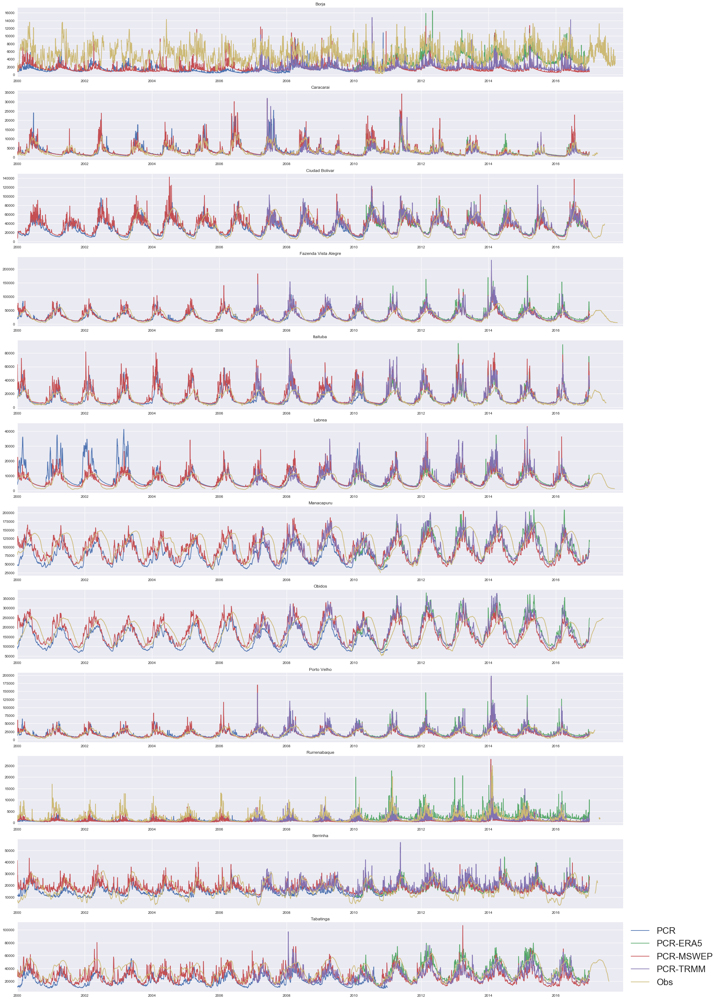

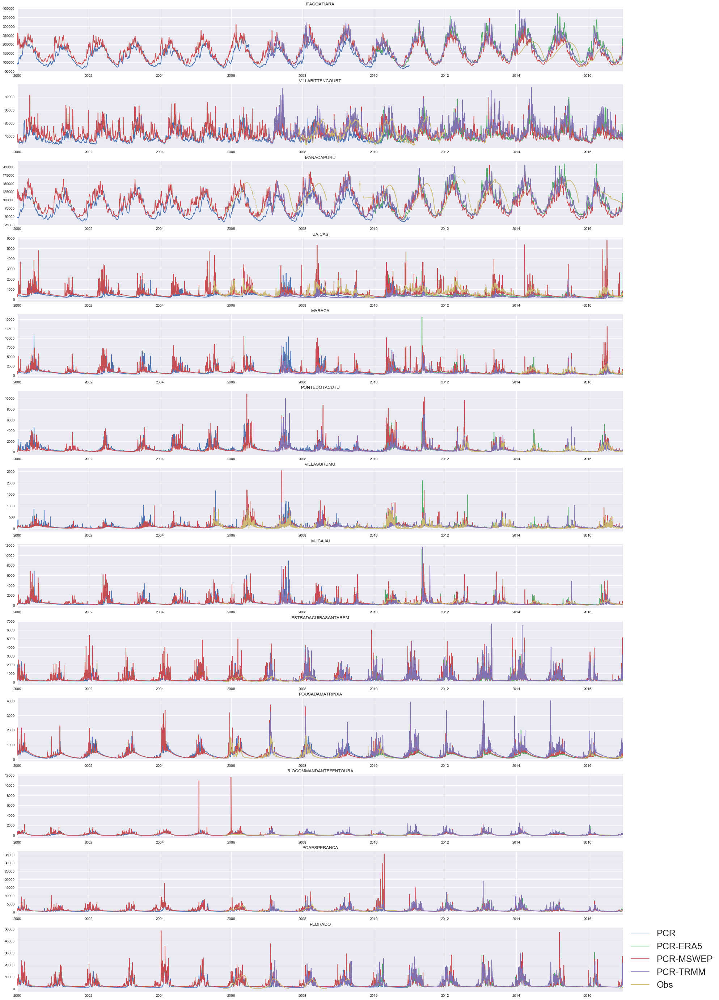

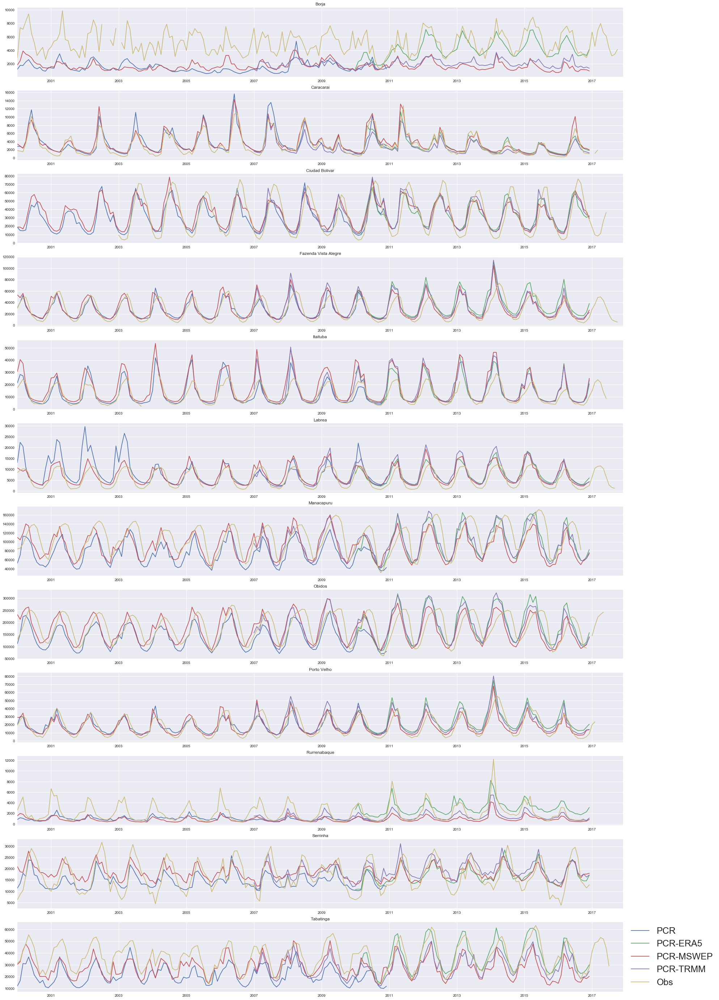

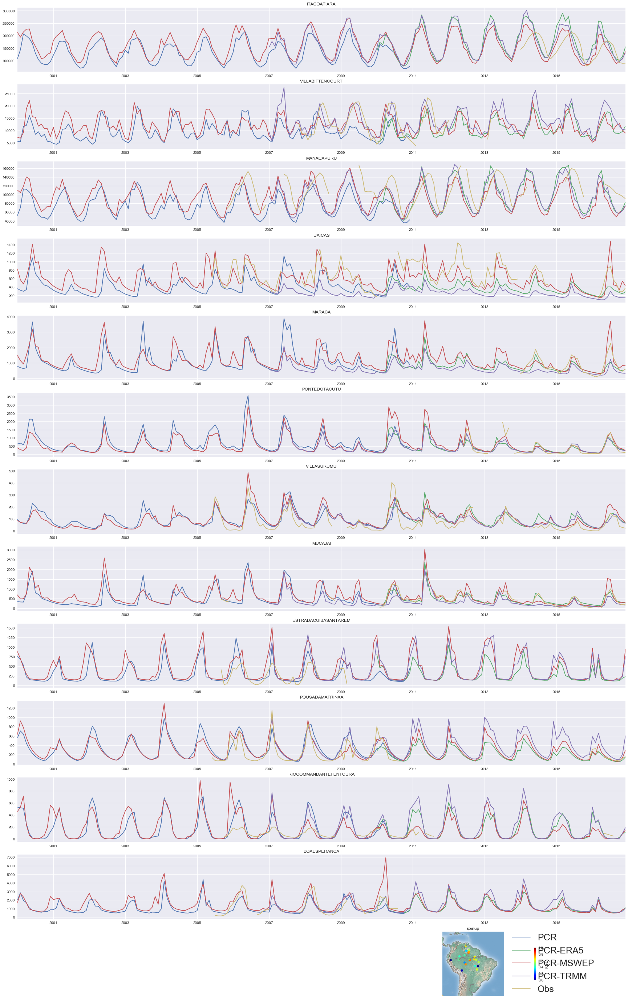

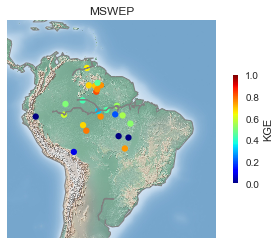

...

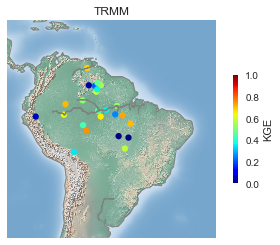

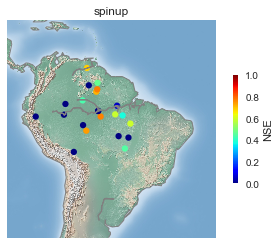

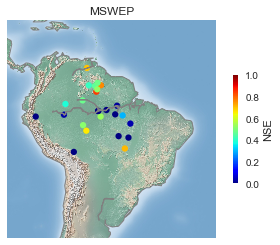

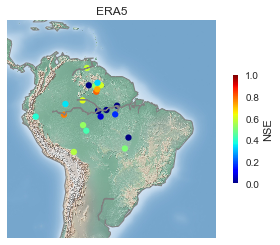

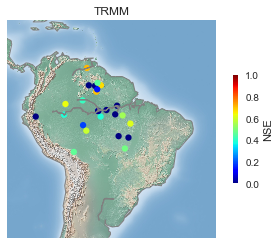

In [2]:
import numpy as np
import os,sys
import pandas as pd
import netCDF4 as nc
from datetime import datetime
from datetime import timedelta
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import seaborn as sns
import fileinput
%matplotlib inline

def find_nearest(array,value):
    idx = (np.abs(array-value)).argmin()
    return array[idx],idx

# Read HYBAM Discharge files
print('HYBAM')
# Specify paths - Only relevant csv files in that folder!
KNMIpath = "/nobackup/users/killaars/ELNino/Discharge_HYBAM/"
MACpath = "/Users/killaars/PhD/Elnino/Discharge/discharge_files_HYBAM/"
path=MACpath

# Create dataframe in which the station date will be inserted, first timeseries as the index
timeseries = pd.date_range('1/1/2000', '31/12/2017', freq='D')
hybamdata = pd.DataFrame({},index=timeseries)

# Go through all the files in the directory one by one
for root, dirs, files in os.walk(path):
    for file in sorted(files):
        if file.endswith('.csv'):
            #print(file)
            if file.startswith("coordinates"):
                coords = pd.read_csv(os.path.join(path,file),sep=";",index_col="station_name")
            else:
                # Read csv file. Columns are separated by ';' and names are given below. 
                data = pd.read_csv(os.path.join(path,file),sep=";")
                data=data.drop(data.index[0])
                data.columns = ["station_id", "nom", "date", "Discharge", "origin", "quality"]
                # Split date column into date and time. Time is not needed, as it is daily data
                data = data.join(data['date'].str.split(' ', 1, expand=True).rename(columns={0:'Date', 1:'Time'}))
                # Create new time column with same format as the big dataframe
                data["new_date"]=pd.to_datetime(data["Date"],format='%d/%m/%Y')
                # Put discharge column in new dataframe with the correct time index
                newdata=pd.DataFrame({data.loc[1,'nom'] : data['Discharge'].values.astype('float32')},index=data['new_date'])
                # Put station data in the big dataframe with the stationname.
                hybamdata[data.loc[1,'nom']]=newdata

# Read PCR-GLOBWB discharge data from file
outputpath = '/Users/killaars/PhD/Elnino/Discharge/discharge_dailyTot_output_spinup.nc'
data_PCR_fh = nc.Dataset(outputpath,mode='r')
lat_PCR = data_PCR_fh.variables['latitude'][:]
lon_PCR = data_PCR_fh.variables['longitude'][:]
discharge_PCR_spinup = data_PCR_fh.variables['discharge'][:]
times_PCR = data_PCR_fh.variables['time'][:]

# Convert days since 01-01-1901 to date in format DD/MM/YYYY
date_format = '%Y-%m-%d'
startdate = datetime.strptime('1901-01-01', date_format)
dates_PCR=[]
for time in times_PCR:
    date = startdate+timedelta(days=time)
    dates_PCR = np.append(dates_PCR,date.strftime(date_format))

data_PCR_fh.close()

# 3 different precipitation datasets
# ERA5
data_PCR_ERA5_fh = nc.Dataset('/Users/killaars/PhD/Elnino/Discharge/discharge_dailyTot_output_ERA5_KW_2010_2017_newPET.nc',mode='r')
discharge_PCR_ERA5 = data_PCR_ERA5_fh.variables['discharge'][:]
data_PCR_ERA5_fh.close()
# MSWEP
#data_PCR_MSWEP_fh = nc.Dataset('/Users/killaars/PhD/Elnino/Discharge/discharge_dailyTot_output_MSWEP_KW_2000_2016_newPET.nc',mode='r')
data_PCR_MSWEP_fh = nc.Dataset('/Users/killaars/PhD/Elnino/Discharge/MSWEP_newspinup_discharge_dailyTot_output.nc',mode='r')

discharge_PCR_MSWEP = data_PCR_MSWEP_fh.variables['discharge'][:]
data_PCR_MSWEP_fh.close()
# TRMM
data_PCR_TRMM_fh = nc.Dataset('/Users/killaars/PhD/Elnino/Discharge/discharge_dailyTot_output_TRMM_KW_2007_2016_newPET.nc',mode='r')
discharge_PCR_TRMM = data_PCR_TRMM_fh.variables['discharge'][:]
data_PCR_TRMM_fh.close()

# Create empty dataframe for the discharge of PCR, with date of 2000-2010 as index for the spinup 
# and date of 2010-2017 as index for the other
timeseries_2000_2010 = pd.date_range('1/1/2000', '31/12/2010', freq='D')
timeseries_2000_2016 = pd.date_range('1/1/2000', '31/12/2016', freq='D')
timeseries_2010_2016 = pd.date_range('1/1/2010', '31/12/2016', freq='D')
timeseries_ERA5 = pd.date_range('1/1/2010', '31/12/2016', freq='D')
timeseries_TRMM = pd.date_range('1/1/2007', '31/12/2016', freq='D')
timeseries_MSWEP = pd.date_range('1/1/2000', '31/12/2016', freq='D')
PCR_discharge_spinup = pd.DataFrame({},index=timeseries_2000_2010)
PCR_discharge_ERA5 = pd.DataFrame({},index=timeseries_ERA5)
PCR_discharge_MSWEP = pd.DataFrame({},index=timeseries_MSWEP)
PCR_discharge_TRMM = pd.DataFrame({},index=timeseries_TRMM)

# Reading of Lat/Lon coordinates from textfile is done above
print(coords)
#print(latlon_stations)
for station in coords.index.values:
    print(station) 
    # Match latitude to closest point in the PCR-GLOBWB output
    lat_station_PCR,idx = find_nearest(lat_PCR,coords.loc[station,"latitude"])
    #print(coords.loc[station,"latitude"],lat_station_PCR,idx)
    
    # Match longitude to closest point in the PCR-GLOBWB output
    lon_station_PCR,idy = find_nearest(lon_PCR,coords.loc[station,"longitude"])
    
    # Insert PCR_station locations in dataframe
    coords.loc[station,"latitude_PCR"] = lat_station_PCR
    coords.loc[station,"longitude_PCR"] = lon_station_PCR
    
    # Put data of PCR-GLOBWB in Pandas dataframe
    PCR_discharge_spinup[station] = discharge_PCR_spinup[:,idx,idy]
    PCR_discharge_ERA5[station] = discharge_PCR_ERA5[:,idx,idy]
    PCR_discharge_MSWEP[station] = discharge_PCR_MSWEP[:,idx,idy]
    PCR_discharge_TRMM[station] = discharge_PCR_TRMM[:,idx,idy]

# Multi-plot, one graph for each station.
# ii is counter for the 'axis' of the plot. one for each column
ii=np.arange(0,len(hybamdata.columns.values),1)
print(ii)

fig, axes = plt.subplots(nrows=len(hybamdata.columns.values), ncols=1, figsize=(30, 50))
for i,var in zip(ii,hybamdata.columns.values):
    print(var)
    PCR_discharge_spinup[var].plot(ax=axes[i], title=var,label='PCR')
    PCR_discharge_ERA5[var].plot(ax=axes[i], title=var,label='PCR-ERA5')
    PCR_discharge_MSWEP[var].plot(ax=axes[i], title=var,label='PCR-MSWEP')
    PCR_discharge_TRMM[var].plot(ax=axes[i], title=var,label='PCR-TRMM')
    hybamdata[var].plot(ax=axes[i],label='Obs')
    lgd=plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize=25)


# # Plot locations on map
# m = Basemap(projection='stere',lon_0=-60,lat_0=-15.,lat_ts=50,\
#             llcrnrlat=-35,urcrnrlat=20,\
#             llcrnrlon=-90,urcrnrlon=-30,\
#             rsphere=6371200.,resolution='c',area_thresh=10000)
# m.drawcoastlines(color='.5')
# m.shadedrelief()


# x, y = m(coords.loc[:,"longitude"].values,coords.loc[:,"latitude"].values)
# ms=20
# m.scatter(x,y,ms,marker='o',color='k',label='Surface Flask')
# #plt.savefig('/Users/killaars/PhD/Elnino/Discharge/locations_stations.png',dpi=100)
# plt.show()

# Kling-Gupta Efficiency

def KGE_calc(sim,obs):
    dataframe = pd.DataFrame({'sim' : sim,
                              'obs' : obs})
    r = dataframe.corr().iloc[0,1]
    alfa=dataframe.std().loc['sim']/dataframe.std().loc['obs']
    beta = dataframe.mean().loc['sim']/dataframe.mean().loc['obs']
    ED = np.sqrt(((r-1)**2)+((alfa-1)**2)+((beta-1)**2))
    KGE = 1-ED
    return KGE,r

def NSE_calc(sim,obs):
    dataframe = pd.DataFrame({'sim' : sim,
                              'obs' : obs})
    dataframe["top"]=(dataframe["sim"]-dataframe["obs"])**2
    dataframe["bottom"]=(dataframe["obs"]-dataframe["obs"].mean())**2
    #print(dataframe)
    NSE=1-dataframe["top"].sum()/dataframe["bottom"].sum()
    #print(NSE)
    return NSE

KGE_df = pd.DataFrame(index=hybamdata.columns.values)
NSE_df = pd.DataFrame(index=hybamdata.columns.values)
r_df = pd.DataFrame(index=hybamdata.columns.values)  
for var in hybamdata.columns.values:
    #print(var)
    startdate='2000-01-01'
    enddate='2010-12-31'
    KGE_df.loc[var,"spinup"],r_df.loc[var,"spinup"]=KGE_calc(PCR_discharge_spinup[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
    NSE_df.loc[var,"spinup"]=NSE_calc(PCR_discharge_spinup[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
    startdate='2010-01-01'
    enddate='2016-12-31'
    KGE_df.loc[var,"ERA5"],r_df.loc[var,"ERA5"]=KGE_calc(PCR_discharge_ERA5[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
    KGE_df.loc[var,"TRMM"],r_df.loc[var,"TRMM"]=KGE_calc(PCR_discharge_TRMM[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
    NSE_df.loc[var,"ERA5"]=NSE_calc(PCR_discharge_ERA5[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
    NSE_df.loc[var,"TRMM"]=NSE_calc(PCR_discharge_TRMM[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
    startdate='2000-01-01'
    enddate='2016-12-31'
    KGE_df.loc[var,"MSWEP"],r_df.loc[var,"MSWEP"]=KGE_calc(PCR_discharge_MSWEP[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
    NSE_df.loc[var,"MSWEP"]=NSE_calc(PCR_discharge_MSWEP[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)

###### ANA Data ######
print('ANA')
# Create dataframe in which the station date will be inserted, first timeseries as the index
anadata = pd.DataFrame({},index=timeseries_2000_2016)
names = ['ITACOATIARA','VILLABITTENCOURT','MANACAPURU','UAICAS','MARACA','PONTEDOTACUTU','VILLASURUMU','MUCAJAI','ESTRADACUIBASANTAREM','POUSADAMATRINXA','RIOCOMMANDANTEFENTOURA','BOAESPERANCA','PEDRADO']
path="/Users/killaars/PhD/Elnino/Discharge/discharge_files_ANA/"
for name in names:
    print(name)
    # Go through all the files in the directory one by one
    for root, dirs, files in os.walk(path):
        for file in sorted(files):
            #print(file)
            if file.endswith('.txt'):
                if name in file:
                    print(file)
                    # Read data from file, seperated by space and 4 columns of data
                    fullpath=os.path.join(path,file)
                    data = pd.read_csv(fullpath, sep=" ")
                    data.columns = ["Date", "Time", "Discharge", "etc."]

                    # Delete first line of table:
                    data=data.drop(data.index[0])

                    # Create new data column with similar date format as in the index of the big dataframe:
                    data["new_date"]=pd.to_datetime(data["Date"],format='%d/%m/%Y')

                    # Group data per daily mean
                    grouped_data=data['Discharge'].groupby(data['new_date']).mean()

                    # Insert mean discharge per day of current station in the big dataframe:
                    anadata[name]=grouped_data

# Read Lat/Lon coordinates from textfile, separated by tabs and column 0 is the index
latlon_stations = pd.read_csv('/Users/killaars/PhD/Elnino/Discharge/latlon_mod.txt', sep="\t", index_col=0)
# print(latlon_stations)
for station in anadata.columns.values:
    # print(station)
    # Latitude conversion
    lat_station = latlon_stations.loc["Lat", station ]
    N = 'N' in lat_station
    d, m, s = map(float, lat_station[:-1].split('-'))
    lat_station_dec = (d + m / 60. + s / 3600.) * (1 if N else -1)
    
    # Match to closest point in the PCR-GLOBWB output
    lat_station_dec,idx = find_nearest(lat_PCR,lat_station_dec)
    latlon_stations.loc["Lat", station ] = lat_station_dec
    
    # Longitude conversion
    lon_station = latlon_stations.loc["Lon", station ]
    W = 'W' in lon_station
    d, m, s = map(float, lon_station[:-1].split('-'))
    lon_station_dec = (d + m / 60. + s / 3600.) * (-1 if W else 1)
    
    # Match to closest point in the PCR-GLOBWB output
    lon_station_dec,idy = find_nearest(lon_PCR,lon_station_dec)
    latlon_stations.loc["Lon", station ] = lon_station_dec
    
    # Put data of PCR-GLOBWB in Pandas dataframe
    PCR_discharge_spinup[station] = discharge_PCR_spinup[:,idx,idy]
    PCR_discharge_ERA5[station] = discharge_PCR_ERA5[:,idx,idy]
    PCR_discharge_MSWEP[station] = discharge_PCR_MSWEP[:,idx,idy]
    PCR_discharge_TRMM[station] = discharge_PCR_TRMM[:,idx,idy]

# Multi-plot, one graph for each station.
# ii is counter for the 'axis' of the plot. one for each column
ii=np.arange(0,len(anadata.columns.values),1)
print(ii)

fig, axes = plt.subplots(nrows=len(anadata.columns.values), ncols=1, figsize=(30, 50))
for i,var in zip(ii,anadata.columns.values):
    print(var)            
    PCR_discharge_spinup[var].plot(ax=axes[i], title=var,label='PCR')
    PCR_discharge_ERA5[var].plot(ax=axes[i], title=var,label='PCR-ERA5')
    PCR_discharge_MSWEP[var].plot(ax=axes[i], title=var,label='PCR-MSWEP')
    PCR_discharge_TRMM[var].plot(ax=axes[i], title=var,label='PCR-TRMM')
    anadata[var].plot(ax=axes[i],label='Obs')
    lgd=plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize=25)
    
    # KGE - Spinup - Only calculate the KGE if there are more than 100 values. 
    KGE_interspinup = pd.DataFrame({'spinup' : PCR_discharge_spinup[var],
                                   'OBS_ANA' : anadata[var]},index=timeseries_2000_2016)
    KGE_interspinup=KGE_interspinup.dropna(axis=0, how='any')
    if np.shape(KGE_interspinup)[0]>100:
        KGE_df.loc[var,"spinup"],r_df.loc[var,"spinup"]=KGE_calc(KGE_interspinup['spinup'].values,KGE_interspinup['OBS_ANA'].values)
        NSE_df.loc[var,"spinup"]=NSE_calc(KGE_interspinup['spinup'].values,KGE_interspinup['OBS_ANA'].values)
    else:
        KGE_df.loc[var,"spinup"],r_df.loc[var,"spinup"],NSE_df.loc[var,"spinup"]=np.nan,np.nan,np.nan
    # KGE - MSWEP
    KGE_interMSWEP = pd.DataFrame({'MSWEP' : PCR_discharge_MSWEP[var],
                                   'OBS_ANA' : anadata[var]},index=timeseries_2000_2016)
    KGE_interMSWEP=KGE_interMSWEP.dropna(axis=0, how='any')
    if np.shape(KGE_interMSWEP)[0]>100:
        KGE_df.loc[var,"MSWEP"],r_df.loc[var,"MSWEP"]=KGE_calc(KGE_interMSWEP['MSWEP'].values,KGE_interMSWEP['OBS_ANA'].values)
        NSE_df.loc[var,"MSWEP"]=NSE_calc(KGE_interMSWEP['MSWEP'].values,KGE_interMSWEP['OBS_ANA'].values)
    else:
        KGE_df.loc[var,"MSWEP"],r_df.loc[var,"MSWEP"],NSE_df.loc[var,"MSWEP"]=np.nan,np.nan,np.nan
    # KGE - TRMM
    KGE_interTRMM = pd.DataFrame({'TRMM' : PCR_discharge_TRMM[var],
                                   'OBS_ANA' : anadata[var]},index=timeseries_2000_2016)
    KGE_interTRMM=KGE_interTRMM.dropna(axis=0, how='any')
    if np.shape(KGE_interTRMM)[0]>100:
        KGE_df.loc[var,"TRMM"],r_df.loc[var,"TRMM"]=KGE_calc(KGE_interTRMM['TRMM'].values,KGE_interTRMM['OBS_ANA'].values)
        NSE_df.loc[var,"TRMM"]=NSE_calc(KGE_interTRMM['TRMM'].values,KGE_interTRMM['OBS_ANA'].values)
    else:
        KGE_df.loc[var,"TRMM"],r_df.loc[var,"TRMM"],NSE_df.loc[var,"TRMM"]=np.nan,np.nan,np.nan
    # KGE - ERA5
    KGE_interERA5 = pd.DataFrame({'ERA5' : PCR_discharge_ERA5[var],
                                   'OBS_ANA' : anadata[var]},index=timeseries_2000_2016)
    KGE_interERA5=KGE_interERA5.dropna(axis=0, how='any')
    if np.shape(KGE_interERA5)[0]>100:
        KGE_df.loc[var,"ERA5"],r_df.loc[var,"ERA5"]=KGE_calc(KGE_interERA5['ERA5'].values,KGE_interERA5['OBS_ANA'].values)
        NSE_df.loc[var,"ERA5"]=NSE_calc(KGE_interERA5['ERA5'].values,KGE_interERA5['OBS_ANA'].values)
    else:
        KGE_df.loc[var,"ERA5"],r_df.loc[var,"ERA5"],NSE_df.loc[var,"ERA5"]=np.nan,np.nan,np.nan

print(KGE_df,r_df,NSE_df)
# Monthly means
print('Monthly Means')
PCR_discharge_spinup_M = PCR_discharge_spinup.resample("M").mean()
PCR_discharge_ERA5_M = PCR_discharge_ERA5.resample("M").mean()
PCR_discharge_MSWEP_M = PCR_discharge_MSWEP.resample("M").mean()
PCR_discharge_TRMM_M = PCR_discharge_TRMM.resample("M").mean()
hybamdata_M = hybamdata.resample("M").mean()
anadata_M = anadata.resample("M").mean()

KGE_df_M = pd.DataFrame(index=hybamdata_M.columns.values)
NSE_df_M = pd.DataFrame(index=hybamdata_M.columns.values)
r_df_M = pd.DataFrame(index=hybamdata_M.columns.values)

# Multi-plot, one graph for each station.
# ii is counter for the 'axis' of the plot. one for each column
ii=np.arange(0,len(hybamdata_M.columns.values),1)
print(ii)

fig, axes = plt.subplots(nrows=len(hybamdata_M.columns.values), ncols=1, figsize=(30, 50))
for i,var in zip(ii,hybamdata_M.columns.values):
    print(var)
    PCR_discharge_spinup_M[var].plot(ax=axes[i], title=var,label='PCR')
    PCR_discharge_ERA5_M[var].plot(ax=axes[i], title=var,label='PCR-ERA5')
    PCR_discharge_MSWEP_M[var].plot(ax=axes[i], title=var,label='PCR-MSWEP')
    PCR_discharge_TRMM_M[var].plot(ax=axes[i], title=var,label='PCR-TRMM')
    hybamdata_M[var].plot(ax=axes[i],label='Obs')
    lgd=plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize=25)
    
# Multi-plot, one graph for each station.
# ii is counter for the 'axis' of the plot. one for each column
ii=np.arange(0,len(anadata_M.columns.values),1)
print(ii)

fig, axes = plt.subplots(nrows=len(anadata_M.columns.values), ncols=1, figsize=(30, 50))
for i,var in zip(ii,anadata_M.columns.values):
    print(var)
    PCR_discharge_spinup_M[var].plot(ax=axes[i], title=var,label='PCR')
    PCR_discharge_ERA5_M[var].plot(ax=axes[i], title=var,label='PCR-ERA5')
    PCR_discharge_MSWEP_M[var].plot(ax=axes[i], title=var,label='PCR-MSWEP')
    PCR_discharge_TRMM_M[var].plot(ax=axes[i], title=var,label='PCR-TRMM')
    anadata_M[var].plot(ax=axes[i],label='Obs')
    lgd=plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize=25)
    # KGE - Spinup - Only calculate the KGE if there are more than 10 values. 
    KGE_interspinup_M = pd.DataFrame({'spinup' : PCR_discharge_spinup_M[var],
                                   'OBS_ANA' : anadata_M[var]},index=timeseries_2000_2016)
    KGE_interspinup_M=KGE_interspinup_M.dropna(axis=0, how='any')
    if np.shape(KGE_interspinup_M)[0]>10:
        KGE_df_M.loc[var,"spinup"],r_df_M.loc[var,"spinup"]=KGE_calc(KGE_interspinup_M['spinup'].values,KGE_interspinup_M['OBS_ANA'].values)
        NSE_df_M.loc[var,"spinup"]=NSE_calc(KGE_interspinup_M['spinup'].values,KGE_interspinup_M['OBS_ANA'].values)
    else:
        KGE_df_M.loc[var,"spinup"],r_df_M.loc[var,"spinup"],NSE_df_M.loc[var,"spinup"]=np.nan,np.nan,np.nan
    # KGE - MSWEP
    KGE_interMSWEP_M = pd.DataFrame({'MSWEP' : PCR_discharge_MSWEP_M[var],
                                   'OBS_ANA' : anadata_M[var]},index=timeseries_2000_2016)
    KGE_interMSWEP_M=KGE_interMSWEP_M.dropna(axis=0, how='any')
    if np.shape(KGE_interMSWEP_M)[0]>10:
        KGE_df_M.loc[var,"MSWEP"],r_df_M.loc[var,"MSWEP"]=KGE_calc(KGE_interMSWEP_M['MSWEP'].values,KGE_interMSWEP_M['OBS_ANA'].values)
        NSE_df_M.loc[var,"MSWEP"]=NSE_calc(KGE_interMSWEP_M['MSWEP'].values,KGE_interMSWEP_M['OBS_ANA'].values)
    else:
        KGE_df_M.loc[var,"MSWEP"],r_df_M.loc[var,"MSWEP"],NSE_df_M.loc[var,"MSWEP"]=np.nan,np.nan,np.nan
    # KGE - TRMM
    KGE_interTRMM_M = pd.DataFrame({'TRMM' : PCR_discharge_TRMM_M[var],
                                   'OBS_ANA' : anadata_M[var]},index=timeseries_2000_2016)
    KGE_interTRMM_M=KGE_interTRMM_M.dropna(axis=0, how='any')
    if np.shape(KGE_interTRMM_M)[0]>10:
        KGE_df_M.loc[var,"TRMM"],r_df_M.loc[var,"TRMM"]=KGE_calc(KGE_interTRMM_M['TRMM'].values,KGE_interTRMM_M['OBS_ANA'].values)
        NSE_df_M.loc[var,"TRMM"]=NSE_calc(KGE_interTRMM_M['TRMM'].values,KGE_interTRMM_M['OBS_ANA'].values)
    else:
        KGE_df_M.loc[var,"TRMM"],r_df_M.loc[var,"TRMM"],NSE_df_M.loc[var,"TRMM"]=np.nan,np.nan,np.nan
    # KGE - ERA5
    KGE_interERA5_M = pd.DataFrame({'ERA5' : PCR_discharge_ERA5_M[var],
                                   'OBS_ANA' : anadata_M[var]},index=timeseries_2000_2016)
    KGE_interERA5_M=KGE_interERA5_M.dropna(axis=0, how='any')
    if np.shape(KGE_interERA5_M)[0]>10:
        KGE_df_M.loc[var,"ERA5"],r_df_M.loc[var,"ERA5"]=KGE_calc(KGE_interERA5_M['ERA5'].values,KGE_interERA5_M['OBS_ANA'].values)
        NSE_df_M.loc[var,"ERA5"]=NSE_calc(KGE_interERA5_M['ERA5'].values,KGE_interERA5_M['OBS_ANA'].values)
    else:
        KGE_df_M.loc[var,"ERA5"],r_df_M.loc[var,"ERA5"],NSE_df_M.loc[var,"ERA5"]=np.nan,np.nan,np.nan

#plot monthly discharge graphs
for var in hybamdata.columns.values:
    print(var)
    startdate='2000-01-01'
    enddate='2010-12-31'
    KGE_df_M.loc[var,"spinup"],r_df_M.loc[var,"spinup"]=KGE_calc(PCR_discharge_spinup_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
    NSE_df_M.loc[var,"spinup"]=NSE_calc(PCR_discharge_spinup_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
    startdate='2010-01-01'
    enddate='2016-12-31'
    KGE_df_M.loc[var,"ERA5"],r_df_M.loc[var,"ERA5"]=KGE_calc(PCR_discharge_ERA5_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
    KGE_df_M.loc[var,"TRMM"],r_df_M.loc[var,"TRMM"]=KGE_calc(PCR_discharge_TRMM_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
    NSE_df_M.loc[var,"ERA5"]=NSE_calc(PCR_discharge_ERA5_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
    NSE_df_M.loc[var,"TRMM"]=NSE_calc(PCR_discharge_TRMM_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
    startdate='2000-01-01'
    enddate='2016-12-31'
    KGE_df_M.loc[var,"MSWEP"],r_df_M.loc[var,"MSWEP"]=KGE_calc(PCR_discharge_MSWEP_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
    NSE_df_M.loc[var,"MSWEP"]=NSE_calc(PCR_discharge_MSWEP_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)

####### KGE NSE plots   
for var in KGE_df_M.index.values:
    if var in coords.index.values:
        KGE_df_M.loc[var,"lon"]=coords.loc[var,"longitude"]
        KGE_df_M.loc[var,"lat"]=coords.loc[var,"latitude"]
    else:
        KGE_df_M.loc[var,"lon"]=latlon_stations.loc["Lon",var]
        KGE_df_M.loc[var,"lat"]=latlon_stations.loc["Lat",var]

print(KGE_df_M)
print(NSE_df_M)
print(r_df_M)
        
#plot KGE
precips=('spinup','MSWEP','ERA5','TRMM')
for precip in precips:
    # Plot locations on map
    m = Basemap(projection='stere',lon_0=-60,lat_0=-15.,lat_ts=50,\
                llcrnrlat=-35,urcrnrlat=20,\
                llcrnrlon=-90,urcrnrlon=-30,\
                rsphere=6371200.,resolution='c',area_thresh=10000)
    m.drawcoastlines(color='.5')
    m.shadedrelief()

    x,y = m(KGE_df_M["lon"].values, KGE_df_M["lat"].values)                            # This is the step that transforms the data into the map's projection
    #m.plot(x,y, 'bo', markersize=5)

    # Color the transformed points!
    sc = plt.scatter(x,y, c=KGE_df_M[precip].values, vmin=0, vmax =1, cmap=plt.cm.get_cmap('jet'), s=40, edgecolors='none')
    # And let's include that colorbar
    cbar = plt.colorbar(sc, shrink = .5)
    cbar.set_label("KGE")
    plt.title(precip)
    #plt.savefig('/Users/killaars/PhD/Elnino/Discharge/locations_stations.png',dpi=100)
    plt.show()

#plot NSE
precips=('spinup','MSWEP','ERA5','TRMM')
for precip in precips:
    # Plot locations on map
    m = Basemap(projection='stere',lon_0=-60,lat_0=-15.,lat_ts=50,\
                llcrnrlat=-35,urcrnrlat=20,\
                llcrnrlon=-90,urcrnrlon=-30,\
                rsphere=6371200.,resolution='c',area_thresh=10000)
    m.drawcoastlines(color='.5')
    m.shadedrelief()

    x,y = m(KGE_df_M["lon"].values, KGE_df_M["lat"].values)                            # This is the step that transforms the data into the map's projection
    #m.plot(x,y, 'bo', markersize=5)

    # Color the transformed points!
    sc = plt.scatter(x,y, c=NSE_df_M[precip].values, vmin=0, vmax =1, cmap=plt.cm.get_cmap('jet'), s=40, edgecolors='none')
    # And let's include that colorbar
    cbar = plt.colorbar(sc, shrink = .5)
    cbar.set_label("NSE")
    plt.title(precip)
    #plt.savefig('/Users/killaars/PhD/Elnino/Discharge/locations_stations.png',dpi=100)
    plt.show()

/Users/killaars/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3296: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/Users/killaars/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3305: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)
/Users/killaars/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3260: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/Users/killaars/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3269: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


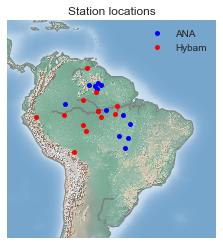

In [7]:
ANAlat=[]
ANAlon=[]
HYlat=[]
HYlon=[]
for var in KGE_df_M.index.values:
    if var in coords.index.values:
        HYlat=np.append(HYlat,coords.loc[var,"latitude"])
        HYlon=np.append(HYlon,coords.loc[var,"longitude"])
#         KGE_df_M.loc[var,"lon"]=coords.loc[var,"longitude"]
#         KGE_df_M.loc[var,"lat"]=coords.loc[var,"latitude"]
    else:
        ANAlat=np.append(ANAlat,latlon_stations.loc["Lat",var])
        ANAlon=np.append(ANAlon,latlon_stations.loc["Lon",var])
#         KGE_df_M.loc[var,"lon"]=latlon_stations.loc["Lon",var]
#         KGE_df_M.loc[var,"lat"]=latlon_stations.loc["Lat",var]

m = Basemap(projection='stere',lon_0=-60,lat_0=-15.,lat_ts=50,\
                llcrnrlat=-35,urcrnrlat=20,\
                llcrnrlon=-90,urcrnrlon=-30,\
                rsphere=6371200.,resolution='c',area_thresh=10000)
m.drawcoastlines(color='.5')
m.shadedrelief()

x,y = m(ANAlon, ANAlat)                            
m.plot(x,y, 'bo', markersize=5,label='ANA')
x,y = m(HYlon, HYlat)                            
m.plot(x,y, 'ro', markersize=5,label='Hybam')
plt.title("Station locations")
lgd=plt.legend()
#plt.savefig('/Users/killaars/PhD/Elnino/Discharge/locations_stations.png',dpi=100)
plt.show()

ITACOATIARA
16030000ITACOATIARA_2312014-20122017.txt
VILLABITTENCOURT
12845000VILLABITTENCOURT_2572005-1882017.txt
MANACAPURU
14100000MANACAPURU_15112005-20122017.txt
UAICAS
14488000UAICAS_2962005-20122017.txt
MARACA
14489000MARACA_1512013-20122017.txt
PONTEDOTACUTU
14527000PONTEDOTACUTU_762012-20122017.txt
VILLASURUMU
14530000VILLASURUMU_2962005-20122017.txt
MUCAJAI
14690000MUCAJAI_2592005-20122017.txt
ESTRADACUIBASANTAREM
17343000ESTRADACUIBASANTAREM_1792005-20122017.txt
POUSADAMATRINXA
18415000POUSADAMATRINXA_2962005-312017.txt
RIOCOMMANDANTEFENTOURA
18435000RIOCOMMANDANTEFENTOURA_8102005-292016.txt
BOAESPERANCA
18500000BOAESPERANCA_3172005-20122017.txt
PEDRADO
18700000PEDRADO_10102005-2422017.txt
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
ITACOATIARA


/Users/killaars/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


VILLABITTENCOURT
MANACAPURU
UAICAS
MARACA
PONTEDOTACUTU
VILLASURUMU
MUCAJAI
ESTRADACUIBASANTAREM
POUSADAMATRINXA
RIOCOMMANDANTEFENTOURA
BOAESPERANCA
PEDRADO
                          spinup      ERA5      TRMM     MSWEP
Borja                  -0.168969  0.522780  0.000499 -0.109213
Caracarai               0.696760  0.742034  0.632348  0.753088
Ciudad Bolivar          0.660091  0.584693  0.695255  0.629054
Fazenda Vista Alegre    0.796329  0.379121  0.560765  0.715404
Itaituba                0.608110  0.199987  0.089154  0.218001
Labrea                  0.157777  0.576057  0.325881  0.698341
Manacapuru              0.576004  0.536239  0.527906  0.426221
Obidos                  0.644851  0.467287  0.501163  0.527951
Porto Velho             0.760689  0.528825  0.617959  0.688240
Rurrenabaque            0.009209  0.506076  0.381138  0.124081
Serrinha                0.439355  0.540298  0.522681  0.445687
Tabatinga               0.459723  0.830222  0.631811  0.507788
ITACOATIARA             

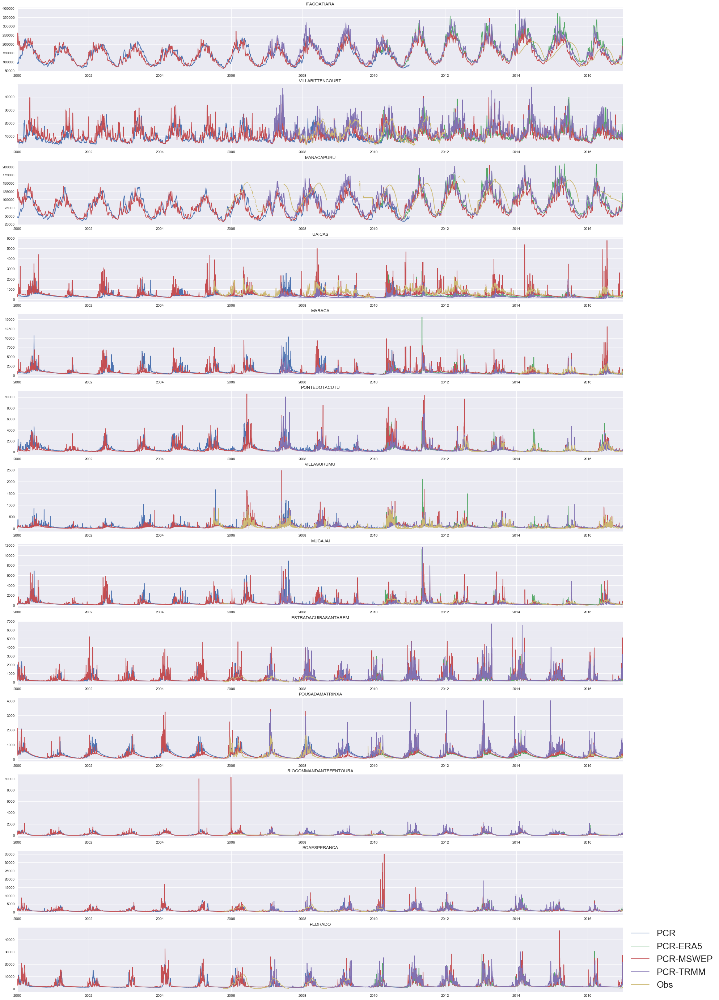

In [3]:
###### ANA Data ######
# Create dataframe in which the station date will be inserted, first timeseries as the index
anadata = pd.DataFrame({},index=timeseries_2000_2016)
names = ['ITACOATIARA','VILLABITTENCOURT','MANACAPURU','UAICAS','MARACA','PONTEDOTACUTU','VILLASURUMU','MUCAJAI','ESTRADACUIBASANTAREM','POUSADAMATRINXA','RIOCOMMANDANTEFENTOURA','BOAESPERANCA','PEDRADO']
for name in names:
    print(name)
    # Go through all the files in the directory one by one
    for root, dirs, files in os.walk(path):
        for file in sorted(files):
            #print(file)
            if file.endswith('.txt'):
                if name in file:
                    print(file)
                    # Read data from file, seperated by space and 4 columns of data
                    fullpath=os.path.join(path,file)
                    data = pd.read_csv(fullpath, sep=" ")
                    data.columns = ["Date", "Time", "Discharge", "etc."]

                    # Delete first line of table:
                    data=data.drop(data.index[0])

                    # Create new data column with similar date format as in the index of the big dataframe:
                    data["new_date"]=pd.to_datetime(data["Date"],format='%d/%m/%Y')

                    # Group data per daily mean
                    grouped_data=data['Discharge'].groupby(data['new_date']).mean()

                    # Insert mean discharge per day of current station in the big dataframe:
                    anadata[name]=grouped_data

# Read Lat/Lon coordinates from textfile, separated by tabs and column 0 is the index
latlon_stations = pd.read_csv('/Users/killaars/PhD/Elnino/Discharge/latlon_mod.txt', sep="\t", index_col=0)
# print(latlon_stations)
for station in anadata.columns.values:
    # print(station)
    # Latitude conversion
    lat_station = latlon_stations.loc["Lat", station ]
    N = 'N' in lat_station
    d, m, s = map(float, lat_station[:-1].split('-'))
    lat_station_dec = (d + m / 60. + s / 3600.) * (1 if N else -1)
    
    # Match to closest point in the PCR-GLOBWB output
    lat_station_dec,idx = find_nearest(lat_PCR,lat_station_dec)
    latlon_stations.loc["Lat", station ] = lat_station_dec
    
    # Longitude conversion
    lon_station = latlon_stations.loc["Lon", station ]
    W = 'W' in lon_station
    d, m, s = map(float, lon_station[:-1].split('-'))
    lon_station_dec = (d + m / 60. + s / 3600.) * (-1 if W else 1)
    
    # Match to closest point in the PCR-GLOBWB output
    lon_station_dec,idy = find_nearest(lon_PCR,lon_station_dec)
    latlon_stations.loc["Lon", station ] = lon_station_dec
    
    # Put data of PCR-GLOBWB in Pandas dataframe
    PCR_discharge_spinup[station] = discharge_PCR_spinup[:,idx,idy]
    PCR_discharge_ERA5[station] = discharge_PCR_ERA5[:,idx,idy]
    PCR_discharge_MSWEP[station] = discharge_PCR_MSWEP[:,idx,idy]
    PCR_discharge_TRMM[station] = discharge_PCR_TRMM[:,idx,idy]

# Multi-plot, one graph for each station.
# ii is counter for the 'axis' of the plot. one for each column
ii=np.arange(0,len(anadata.columns.values),1)
print(ii)

fig, axes = plt.subplots(nrows=len(anadata.columns.values), ncols=1, figsize=(30, 50))
for i,var in zip(ii,anadata.columns.values):
    print(var)            
    PCR_discharge_spinup[var].plot(ax=axes[i], title=var,label='PCR')
    PCR_discharge_ERA5[var].plot(ax=axes[i], title=var,label='PCR-ERA5')
    PCR_discharge_MSWEP[var].plot(ax=axes[i], title=var,label='PCR-MSWEP')
    PCR_discharge_TRMM[var].plot(ax=axes[i], title=var,label='PCR-TRMM')
    anadata[var].plot(ax=axes[i],label='Obs')
    lgd=plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize=25)
    
    # KGE - Spinup - Only calculate the KGE if there are more than 100 values. 
    KGE_interspinup = pd.DataFrame({'spinup' : PCR_discharge_spinup[var],
                                   'OBS_ANA' : anadata[var]},index=timeseries_2000_2016)
    KGE_interspinup=KGE_interspinup.dropna(axis=0, how='any')
    if np.shape(KGE_interspinup)[0]>100:
        KGE_df.loc[var,"spinup"],r_df.loc[var,"spinup"]=KGE_calc(KGE_interspinup['spinup'].values,KGE_interspinup['OBS_ANA'].values)
    else:
        KGE_df.loc[var,"spinup"],r_df.loc[var,"spinup"]=np.nan,np.nan
    # KGE - MSWEP
    KGE_interMSWEP = pd.DataFrame({'MSWEP' : PCR_discharge_MSWEP[var],
                                   'OBS_ANA' : anadata[var]},index=timeseries_2000_2016)
    KGE_interMSWEP=KGE_interMSWEP.dropna(axis=0, how='any')
    if np.shape(KGE_interMSWEP)[0]>100:
        KGE_df.loc[var,"MSWEP"],r_df.loc[var,"MSWEP"]=KGE_calc(KGE_interMSWEP['MSWEP'].values,KGE_interMSWEP['OBS_ANA'].values)
    else:
        KGE_df.loc[var,"MSWEP"],r_df.loc[var,"MSWEP"]=np.nan,np.nan
    # KGE - TRMM
    KGE_interTRMM = pd.DataFrame({'TRMM' : PCR_discharge_TRMM[var],
                                   'OBS_ANA' : anadata[var]},index=timeseries_2000_2016)
    KGE_interTRMM=KGE_interTRMM.dropna(axis=0, how='any')
    if np.shape(KGE_interTRMM)[0]>100:
        KGE_df.loc[var,"TRMM"],r_df.loc[var,"TRMM"]=KGE_calc(KGE_interTRMM['TRMM'].values,KGE_interTRMM['OBS_ANA'].values)
    else:
        KGE_df.loc[var,"TRMM"],r_df.loc[var,"TRMM"]=np.nan,np.nan
    # KGE - ERA5
    KGE_interERA5 = pd.DataFrame({'ERA5' : PCR_discharge_ERA5[var],
                                   'OBS_ANA' : anadata[var]},index=timeseries_2000_2016)
    KGE_interERA5=KGE_interERA5.dropna(axis=0, how='any')
    if np.shape(KGE_interERA5)[0]>100:
        KGE_df.loc[var,"ERA5"],r_df.loc[var,"ERA5"]=KGE_calc(KGE_interERA5['ERA5'].values,KGE_interERA5['OBS_ANA'].values)
    else:
        KGE_df.loc[var,"ERA5"],r_df.loc[var,"ERA5"]=np.nan,np.nan
print(KGE_df)
print(r_df)

In [34]:
print(KGE_df)
print(len(KGE_df.index.values))
for var in KGE_df.index.values:
    print(var)
    KGE_df['Max'] = KGE_df.idxmax(axis=1)
KGE_df.plot(kind='bar',figsize=[30,15],xticks=np.arange(0,len(KGE_df.index.values)+1,1),ylim=[0,1],rot=90,fontsize=40)
print(KGE_df)

[1 2 3 4]


AttributeError: 'numpy.ndarray' object has no attribute 'index'

[ 0  1  2  3  4  5  6  7  8  9 10 11]
Borja
Caracarai


/Users/killaars/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


Ciudad Bolivar
Fazenda Vista Alegre
Itaituba
Labrea
Manacapuru
Obidos
Porto Velho
Rurrenabaque
Serrinha
Tabatinga
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
ITACOATIARA
VILLABITTENCOURT
MANACAPURU
UAICAS
MARACA
PONTEDOTACUTU
VILLASURUMU
MUCAJAI
ESTRADACUIBASANTAREM
POUSADAMATRINXA
RIOCOMMANDANTEFENTOURA
BOAESPERANCA
PEDRADO
Borja
Caracarai
Ciudad Bolivar
Fazenda Vista Alegre
Itaituba
Labrea
Manacapuru
Obidos
Porto Velho
Rurrenabaque
Serrinha
Tabatinga
                          spinup     MSWEP      TRMM      ERA5
Borja                  -0.085807 -0.050059  0.052476  0.646453
Caracarai               0.786150  0.911458  0.591719  0.752740
Ciudad Bolivar          0.653650  0.617163  0.689291  0.582672
Fazenda Vista Alegre    0.799551  0.787206  0.657853  0.491894
Itaituba                0.679442  0.393898  0.254209  0.408078
Labrea                  0.263645  0.797063  0.435899  0.619028
Manacapuru              0.584121  0.446646  0.561874  0.572709
Obidos                  0.650463  0.544657

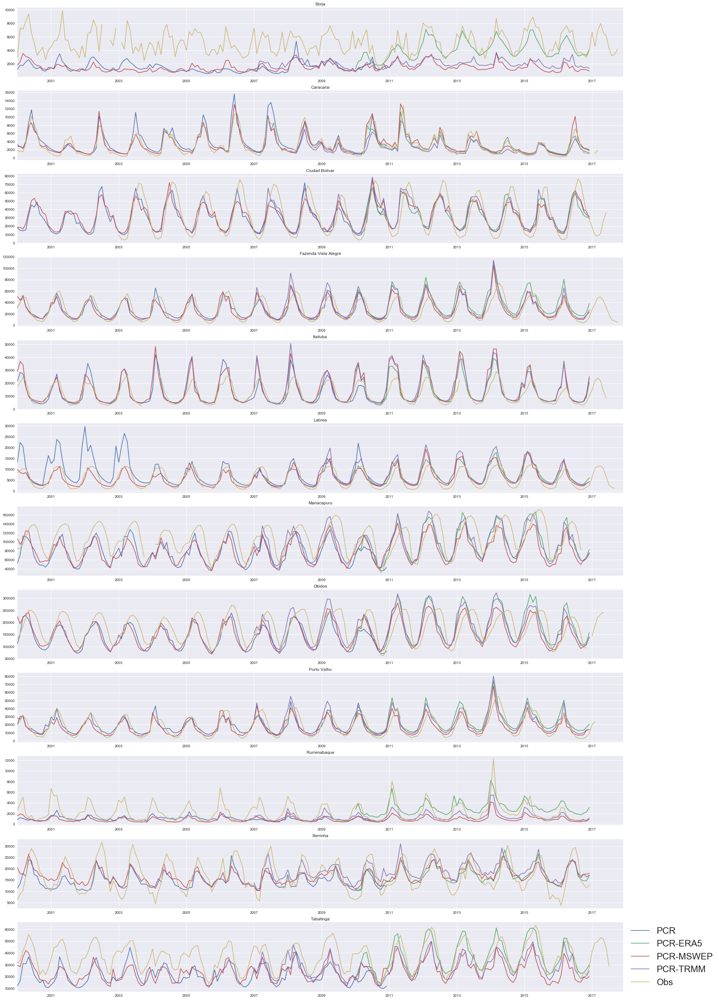

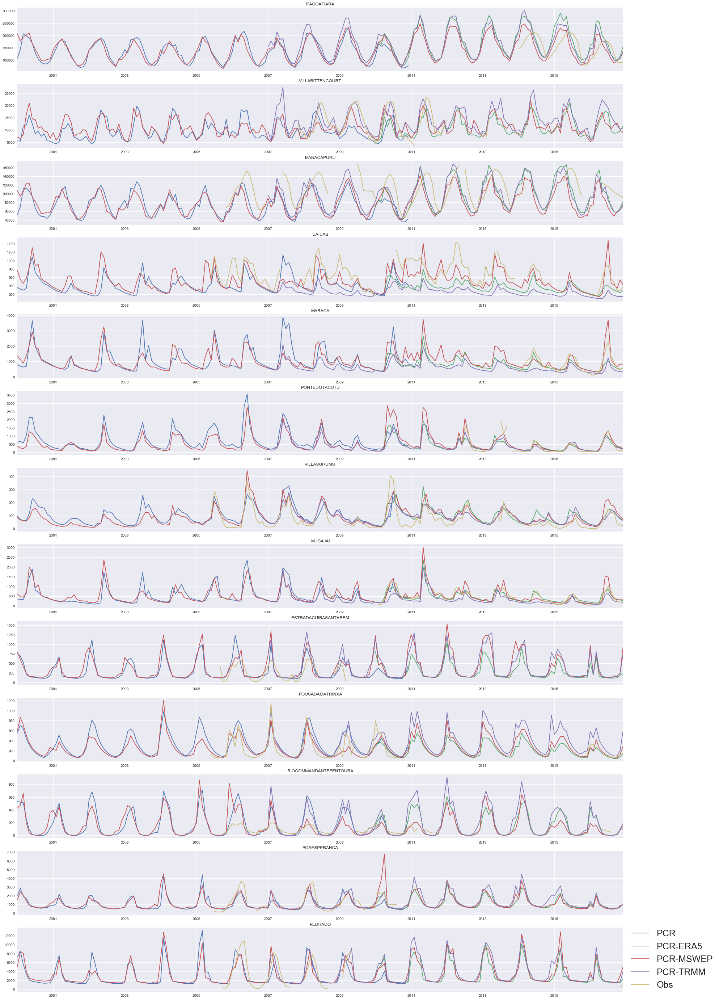

In [61]:
# Monthly means
PCR_discharge_spinup_M = PCR_discharge_spinup.resample("M").mean()
PCR_discharge_ERA5_M = PCR_discharge_ERA5.resample("M").mean()
PCR_discharge_MSWEP_M = PCR_discharge_MSWEP.resample("M").mean()
PCR_discharge_TRMM_M = PCR_discharge_TRMM.resample("M").mean()
hybamdata_M = hybamdata.resample("M").mean()
anadata_M = anadata.resample("M").mean()

KGE_df_M = pd.DataFrame(index=hybamdata_M.columns.values)
r_df_M = pd.DataFrame(index=hybamdata_M.columns.values)

# Multi-plot, one graph for each station.
# ii is counter for the 'axis' of the plot. one for each column
ii=np.arange(0,len(hybamdata_M.columns.values),1)
print(ii)

fig, axes = plt.subplots(nrows=len(hybamdata_M.columns.values), ncols=1, figsize=(30, 50))
for i,var in zip(ii,hybamdata_M.columns.values):
    print(var)
    PCR_discharge_spinup_M[var].plot(ax=axes[i], title=var,label='PCR')
    PCR_discharge_ERA5_M[var].plot(ax=axes[i], title=var,label='PCR-ERA5')
    PCR_discharge_MSWEP_M[var].plot(ax=axes[i], title=var,label='PCR-MSWEP')
    PCR_discharge_TRMM_M[var].plot(ax=axes[i], title=var,label='PCR-TRMM')
    hybamdata_M[var].plot(ax=axes[i],label='Obs')
    lgd=plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize=25)
    
# Multi-plot, one graph for each station.
# ii is counter for the 'axis' of the plot. one for each column
ii=np.arange(0,len(anadata_M.columns.values),1)
print(ii)

fig, axes = plt.subplots(nrows=len(anadata_M.columns.values), ncols=1, figsize=(30, 50))
for i,var in zip(ii,anadata_M.columns.values):
    print(var)
    PCR_discharge_spinup_M[var].plot(ax=axes[i], title=var,label='PCR')
    PCR_discharge_ERA5_M[var].plot(ax=axes[i], title=var,label='PCR-ERA5')
    PCR_discharge_MSWEP_M[var].plot(ax=axes[i], title=var,label='PCR-MSWEP')
    PCR_discharge_TRMM_M[var].plot(ax=axes[i], title=var,label='PCR-TRMM')
    anadata_M[var].plot(ax=axes[i],label='Obs')
    lgd=plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),fontsize=25)
    # KGE - Spinup - Only calculate the KGE if there are more than 10 values. 
    KGE_interspinup_M = pd.DataFrame({'spinup' : PCR_discharge_spinup_M[var],
                                   'OBS_ANA' : anadata_M[var]},index=timeseries_2000_2016)
    KGE_interspinup_M=KGE_interspinup_M.dropna(axis=0, how='any')
    if np.shape(KGE_interspinup_M)[0]>10:
        KGE_df_M.loc[var,"spinup"],r_df_M.loc[var,"spinup"]=KGE_calc(KGE_interspinup_M['spinup'].values,KGE_interspinup_M['OBS_ANA'].values)
    else:
        KGE_df_M.loc[var,"spinup"],r_df_M.loc[var,"spinup"]=np.nan,np.nan
    # KGE - MSWEP
    KGE_interMSWEP_M = pd.DataFrame({'MSWEP' : PCR_discharge_MSWEP_M[var],
                                   'OBS_ANA' : anadata_M[var]},index=timeseries_2000_2016)
    KGE_interMSWEP_M=KGE_interMSWEP_M.dropna(axis=0, how='any')
    if np.shape(KGE_interMSWEP_M)[0]>10:
        KGE_df_M.loc[var,"MSWEP"],r_df_M.loc[var,"MSWEP"]=KGE_calc(KGE_interMSWEP_M['MSWEP'].values,KGE_interMSWEP_M['OBS_ANA'].values)
    else:
        KGE_df_M.loc[var,"MSWEP"],r_df_M.loc[var,"MSWEP"]=np.nan,np.nan
    # KGE - TRMM
    KGE_interTRMM_M = pd.DataFrame({'TRMM' : PCR_discharge_TRMM_M[var],
                                   'OBS_ANA' : anadata_M[var]},index=timeseries_2000_2016)
    KGE_interTRMM_M=KGE_interTRMM_M.dropna(axis=0, how='any')
    if np.shape(KGE_interTRMM_M)[0]>10:
        KGE_df_M.loc[var,"TRMM"],r_df_M.loc[var,"TRMM"]=KGE_calc(KGE_interTRMM_M['TRMM'].values,KGE_interTRMM_M['OBS_ANA'].values)
    else:
        KGE_df_M.loc[var,"TRMM"],r_df_M.loc[var,"TRMM"]=np.nan,np.nan
    # KGE - ERA5
    KGE_interERA5_M = pd.DataFrame({'ERA5' : PCR_discharge_ERA5_M[var],
                                   'OBS_ANA' : anadata_M[var]},index=timeseries_2000_2016)
    KGE_interERA5_M=KGE_interERA5_M.dropna(axis=0, how='any')
    if np.shape(KGE_interERA5_M)[0]>10:
        KGE_df_M.loc[var,"ERA5"],r_df_M.loc[var,"ERA5"]=KGE_calc(KGE_interERA5_M['ERA5'].values,KGE_interERA5_M['OBS_ANA'].values)
    else:
        KGE_df_M.loc[var,"ERA5"],r_df_M.loc[var,"ERA5"]=np.nan,np.nan

  
for var in hybamdata.columns.values:
    print(var)
    startdate='2000-01-01'
    enddate='2010-12-31'
    KGE_df_M.loc[var,"spinup"],r_df_M.loc[var,"spinup"]=KGE_calc(PCR_discharge_spinup_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
    startdate='2010-01-01'
    enddate='2016-12-31'
    KGE_df_M.loc[var,"ERA5"],r_df_M.loc[var,"ERA5"]=KGE_calc(PCR_discharge_ERA5_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
    KGE_df_M.loc[var,"TRMM"],r_df_M.loc[var,"TRMM"]=KGE_calc(PCR_discharge_TRMM_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
    startdate='2000-01-01'
    enddate='2016-12-31'
    KGE_df_M.loc[var,"MSWEP"],r_df_M.loc[var,"MSWEP"]=KGE_calc(PCR_discharge_MSWEP_M[var][startdate:enddate].values,hybamdata_M[var][startdate:enddate].values)
print(KGE_df_M)
print(r_df_M)

/Users/killaars/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3296: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/Users/killaars/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3305: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


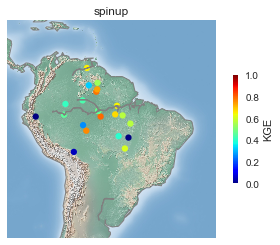

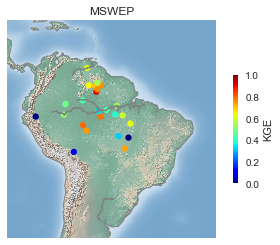

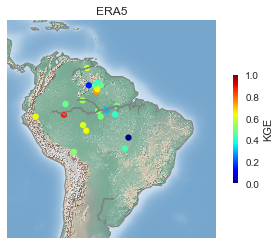

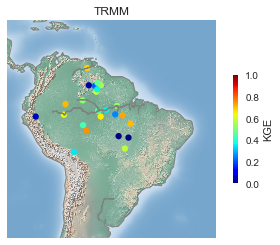

In [80]:
for var in KGE_df_M.index.values:
    #print(var)
    #test.loc[var,"lon"]=counter
    #counter=counter+1
    if var in coords.index.values:
        #print("in coords")
        KGE_df_M.loc[var,"lon"]=coords.loc[var,"longitude"]
        KGE_df_M.loc[var,"lat"]=coords.loc[var,"latitude"]
    else:
        #print("in latlon")
        KGE_df_M.loc[var,"lon"]=latlon_stations.loc["Lon",var]
        KGE_df_M.loc[var,"lat"]=latlon_stations.loc["Lat",var]

#print(KGE_df_M)

precips=('spinup','MSWEP','ERA5','TRMM')
for precip in precips:
    # Plot locations on map
    m = Basemap(projection='stere',lon_0=-60,lat_0=-15.,lat_ts=50,\
                llcrnrlat=-35,urcrnrlat=20,\
                llcrnrlon=-90,urcrnrlon=-30,\
                rsphere=6371200.,resolution='c',area_thresh=10000)
    m.drawcoastlines(color='.5')
    m.shadedrelief()

    x,y = m(KGE_df_M["lon"].values, KGE_df_M["lat"].values)                            # This is the step that transforms the data into the map's projection
    #m.plot(x,y, 'bo', markersize=5)

    # Color the transformed points!
    sc = plt.scatter(x,y, c=KGE_df_M[precip].values, vmin=0, vmax =1, cmap=plt.cm.get_cmap('jet'), s=40, edgecolors='none')
    # And let's include that colorbar
    cbar = plt.colorbar(sc, shrink = .5)
    cbar.set_label("KGE")
    plt.title(precip)
    #plt.savefig('/Users/killaars/PhD/Elnino/Discharge/locations_stations.png',dpi=100)
    plt.show()

In [88]:
def NSE_calc(sim,obs):
    dataframe = pd.DataFrame({'sim' : sim,
                              'obs' : obs})
    dataframe["top"]=(dataframe["sim"]-dataframe["obs"])**2
    dataframe["bottom"]=(dataframe["obs"]-dataframe["obs"].mean())**2
    #print(dataframe)
    NSE=1-dataframe["top"].sum()/dataframe["bottom"].sum()
    #print(NSE)
    return NSE

NSE_df = pd.DataFrame(index=hybamdata.columns.values)
for var in hybamdata.columns.values:
    print(var)
    startdate='2000-01-01'
    enddate='2010-12-31'
    NSE_df.loc[var,"spinup"]=NSE_calc(PCR_discharge_spinup[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
    startdate='2010-01-01'
    enddate='2016-12-31'
    NSE_df.loc[var,"ERA5"]=NSE_calc(PCR_discharge_ERA5[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
    NSE_df.loc[var,"TRMM"]=NSE_calc(PCR_discharge_TRMM[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
    startdate='2000-01-01'
    enddate='2016-12-31'
    NSE_df.loc[var,"MSWEP"]=NSE_calc(PCR_discharge_MSWEP[var][startdate:enddate].values,hybamdata[var][startdate:enddate].values)
print(NSE_df)
sys.exit()

Borja
Caracarai
Ciudad Bolivar
Fazenda Vista Alegre
Itaituba
Labrea
Manacapuru
Obidos
Porto Velho
Rurrenabaque
Serrinha
Tabatinga
                        spinup      ERA5      TRMM     MSWEP
Borja                -2.506327  0.313320 -1.542046 -2.222327
Caracarai             0.492716  0.588283  0.560351  0.443165
Ciudad Bolivar        0.626953  0.498518  0.609341  0.568419
Fazenda Vista Alegre  0.686349 -0.249168  0.157995  0.332950
Itaituba              0.423099 -0.454489 -0.632928 -0.825274
Labrea               -0.952504  0.320679 -0.244907  0.224385
Manacapuru           -0.454288 -0.025368  0.016559 -0.326331
Obidos                0.048810 -0.246497 -0.121033 -0.044765
Porto Velho           0.605169  0.013781  0.212229  0.350284
Rurrenabaque         -0.110871  0.152954  0.278982 -0.009617
Serrinha              0.399241  0.495002  0.234244  0.347353
Tabatinga            -1.162896  0.654913  0.256779 -0.133582


SystemExit: 

/Users/killaars/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2889: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)
